####Importing the libraries and module installation

In [2]:
!pip install python-igraph==0.9.6
!pip install cairocffi

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 19.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for python-igraph: filename=python_igraph-0.9.6-cp310-cp310-linux_x86_64.whl size=2555572 sha256=07a52d98d8024a589a35610a3fffb0d449aa493e154c06bf0ecb0e76377ab670
  Stored in directory: /root/.cache/pip/wheels/ef/14/e6/4f7a42ad0b6bbf5eb65c6358c608065dd3646c2c3b01561e84
Successfully built python-igraph
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.9/86.9 kB 3.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for cairocffi: filename=cairocffi-1.5.1-py3-none-any.whl size=90523 sha256=da54dfac93aef5e

In [3]:
import igraph as ig
import pandas as pd
import matplotlib.pyplot as plt
import csv
import networkx as nx
import numpy as np
import statsmodels.api as sm

####Importing the file and reading the first 5 rows

In [6]:
from google.colab import files
uploaded = files.upload()

Saving dump.csv to dump.csv


In [7]:
dump_csv = 'dump.csv'
data = pd.read_csv(dump_csv)
data.head()

,memberUrn,companyName
0,10013136,Commonwealth Bank
1,10013136,Commonwealth Bank
2,10013136,CommSec
3,10013136,Commonwealth Bank
4,100186032,PayPal


####Constructing the graph

In [8]:
g = ig.Graph()
with open("dump.csv", "r", errors="ignore") as data:
    reader = csv.reader(data)
    next(reader)
    edges = []
    verts = []
    for raw in reader:
        edges.append((raw[0], raw[1]))
        if raw[0] not in verts:
            verts.append(raw[0])
        if raw[1] not in verts:
            verts.append(raw[1])
g.add_vertices(verts)
g.add_edges(edges)
g.simplify()

In [9]:
n = g.vcount()
m = g.ecount()
print("Number of nodes is",n)
print("Number of edges is",m)

Number of nodes is 20610
Number of edges is 29357


In [8]:
# Plot in matplotlib
# Note that attributes can be set globally (e.g. vertex_size), or set individually using arrays (e.g. vertex_color)
#fig, ax = plt.subplots(figsize=(500,500))
#ig.plot(
#    g,
#    target=ax,
#    layout="circle", # print nodes in a circular layout
#    vertex_size=0.3, 
#    vertex_frame_width=4.0,
#    vertex_frame_color="white",
#    vertex_label_size=10.0,
#)

#plt.show()



# Analysis 


####Network type.

Network Type Analysis involves studying and understanding different types of graphs and their characteristics. It focuses on the structure, properties, and applications of various graph types. Our social media graph for LinkedIn  represented as an undirected and unweighted graph. In this graph, the nodes represent LinkedIn users (employees) and Conpanies, and the edges represent the relationships between the users and the companies they work for.

 Each node in the graph represents a LinkedIn user (employee) or company. The nodes contain information such as the user's profile details, job title and skills, and The edges in the graph represent the connections between LinkedIn users and the companies they work for. An edge exists between a user and a company if the user is employed at that company. The edges do not have any weight associated with them since the graph is unweighted.

  Analyzing the social media graph for LinkedIn can provide valuable insights for talent recruitment, job recommendations, understanding industry trends, identifying potential business collaborations, and studying the dynamics of professional networks, also you can gain a deeper understanding of the relationships between employees and the companies they work for, uncover meaningful insights, and leverage the data for various applications in the professional networking domain. 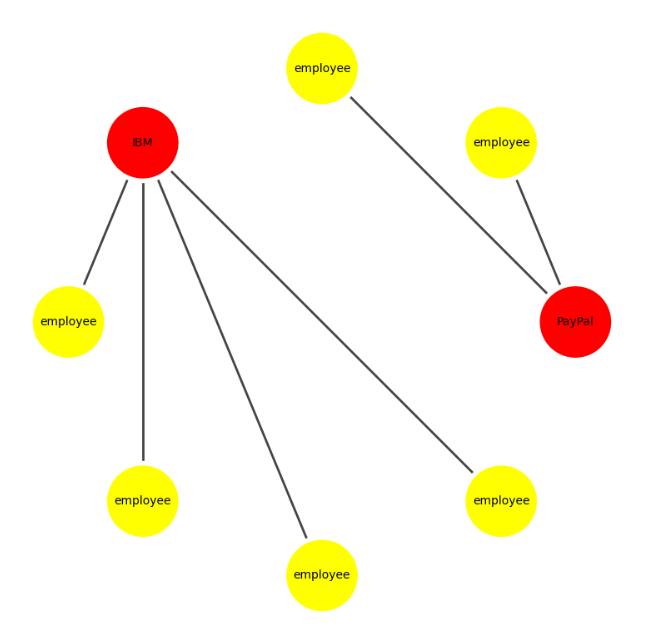

## Safwat's analysis Part 


####Degree distribution analysis.

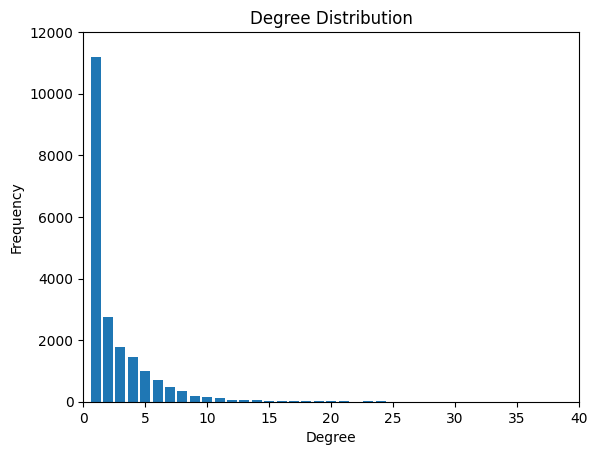

In [9]:
# calculate the degree of each node
gnx = g.to_networkx()
degrees = dict(gnx.degree())

# calculate the frequency of each degree
degree_freq = {}
for degree in degrees.values():
    if degree in degree_freq:
        degree_freq[degree] += 1
    else:
        degree_freq[degree] = 1

# plot the degree distribution
plt.bar(degree_freq.keys(), degree_freq.values())
#plt.xlim(0, max(degree_freq.keys())+1)
#plt.ylim(0, max(degree_freq.values())+1)
plt.xlim(0, 40)
plt.ylim(0, 12000)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution')
plt.show()

####Path analysis.

In [ ]:
# Perform path analysis
shortest_paths = g.shortest_paths(source=0, target=15001, mode=ig.ALL)

# Print the shortest paths
print(f"Shortest paths from vertex 0 to vertex 15001:")
for path in shortest_paths:
    print(path)


Shortest paths from vertex 0 to vertex 15001:
[6]


<ipython-input-43-216cda3fd2b1>:2: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  shortest_paths = g.shortest_paths(source=0, target=15001, mode=ig.ALL)


####Centrality and betweeness analysis.

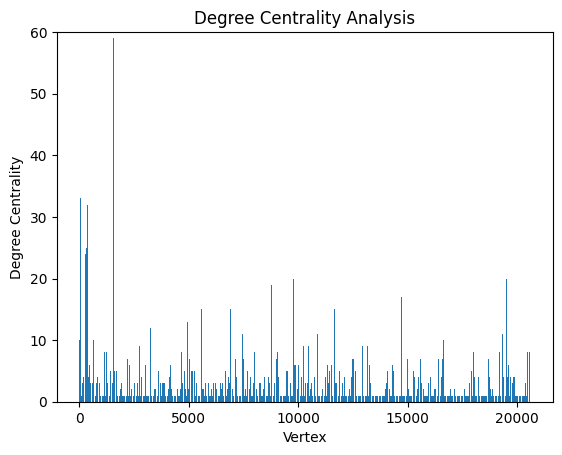

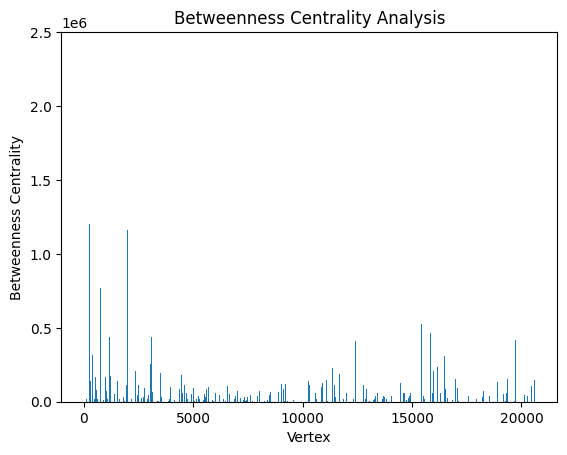

In [ ]:
# calculate degree centrality
# Perform centrality analysis and obtain results
degree_centrality = g.degree()  # Degree centrality
betweenness_centrality = g.betweenness()  # Betweenness centrality

# Plot degree centrality
plt.bar(range(len(degree_centrality)), degree_centrality)
plt.ylim(0, 60)
plt.xlabel("Vertex")
plt.ylabel("Degree Centrality")
plt.title("Degree Centrality Analysis")
plt.show()

# Plot betweenness centrality
plt.bar(range(len(betweenness_centrality)), betweenness_centrality)
plt.ylim(0, 0.25*(10**7))
plt.xlabel("Vertex")
plt.ylabel("Betweenness Centrality")
plt.title("Betweenness Centrality Analysis")
plt.show()

## Fathi's analysis Part 


####Connected components analysis.

Length of Dominant component: 18817


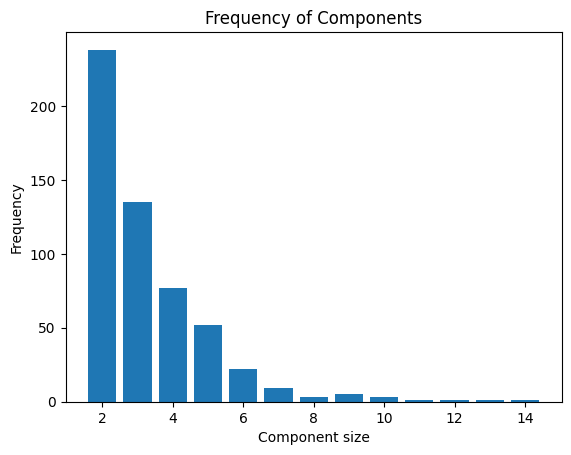

In [10]:
# Get the connected components
components = list(nx.connected_components(gnx))
# The first component is the dominant dominant
dominant = len(components[0])
print("Length of Dominant component:", dominant)

# Create dictionary of sizes and their frequency except the dominant one.
sizes = {}
sample_components = components[1:]
for i in sample_components:
  try:
    sizes[len(i)] += 1
  except KeyError:
    sizes[len(i)] = 1

numbers = list(sizes.keys())
frequencies = list(sizes.values())
plt.bar(numbers, frequencies)
# Add labels and title
plt.xlabel('Component size')
plt.ylabel('Frequency')
plt.title('Frequency of Components')

# Display the chart
plt.show()

We see that there is a component that is dominant in the graph aquiring more than 60% of the nodes, which is a significant portion of the overall network. The other parts are concentrated in the range of 2-10 nodes. The giant component is introduced because of the people who worked in different companies, those are the nodes that connects the huge sub-graph with each other. The 2-in-size components are for sure a person who have worked at only one company and there are no nodes in the graph worked in that same company.

Another interpertation is that if we have a dynamic data, the dominant components will increase its domination by aquiring and merging new or old components to it. And that will happen because new data will most propaly has people who will work in some of those famous companies found in the dominant component.

####Clustering coefficient.

In [12]:
clustering_coefficient = g.transitivity_undirected()

print("Clustering Coefficient:", clustering_coefficient)

Clustering Coefficient: 0.0


The clustering coefficient is a measure that represents the ratio of the 3-pairs
connected nodes. The nature of our graph is that there is no relation between the workers and each other or the companies and each other so there is no triplets in our graph.

A clustering coefficient of 0.0 we got represents this fact that the graph has no closed triplets or triangles. In other words, it indicates that there are no connected triples of nodes that form a closed loop.

The clustering coefficient measures the degree to which vertices in a graph tend to cluster together. A value of 0.0 means that there are no local clusters or communities within the graph. Each node's neighbors are not interconnected or forming triangles with each other.

It's important to note that a clustering coefficient of 0.0 does not necessarily mean that the graph is completely disconnected or lacks any structure. It simply indicates that there are no local clusters of nodes that exhibit high levels of connectivity among their neighbors.

In practical terms, a clustering coefficient of 0.0 might be observed in certain types of random or sparse graphs where connections between nodes are highly unlikely or occur randomly. Additionally, disconnected graphs or graphs with isolated components can also have a clustering coefficient of 0.0 if there are no closed triplets within the individual components.

####Density analysis.

In [1]:
# Get the graph density
print("The graph density is", g.density())


# Calculate the density of each component
#for component in components:
subgraph = g.subgraph(components[0])
dominant_component_density = subgraph.density()

# Print the number of nodes and density of the most dense component
print("Density of the dominant component is", dominant_component_density)


NameError: ignored

## Rashed's analysis Part 


####Community discovery.

In [ ]:
# Perform community detection using the Louvain method
communities = g.community_multilevel()

# Get the number of communities
num_communities = len(communities)
print("Number of communities:", num_communities)

# Get the membership of each vertex
membership = communities.membership
print("Vertex membership:", membership)

Number of communities: 617
Vertex membership: [0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 4, 3, 5, 6, 3, 4, 1, 7, 4, 1, 8, 9, 4, 4, 4, 10, 6, 11, 6, 1, 10, 1, 10, 10, 12, 12, 12, 12, 4, 12, 13, 13, 11, 10, 13, 9, 9, 9, 14, 14, 15, 15, 0, 1, 0, 1, 16, 16, 17, 17, 17, 17, 18, 17, 17, 19, 19, 19, 18, 18, 7, 12, 18, 18, 18, 10, 10, 10, 10, 10, 10, 10, 10, 10, 0, 10, 10, 10, 20, 10, 1, 10, 21, 10, 21, 21, 21, 21, 22, 20, 20, 12, 20, 10, 20, 12, 7, 18, 12, 12, 12, 12, 12, 3, 3, 23, 23, 23, 23, 23, 18, 18, 18, 20, 20, 1, 20, 1, 20, 18, 18, 18, 11, 11, 11, 24, 11, 15, 15, 15, 25, 25, 25, 25, 25, 3, 3, 3, 0, 0, 7, 0, 0, 18, 0, 0, 0, 26, 26, 26, 0, 26, 26, 26, 26, 26, 26, 27, 27, 27, 27, 27, 3, 3, 3, 3, 3, 28, 28, 28, 29, 29, 29, 30, 30, 30, 30, 31, 31, 31, 4, 32, 4, 33, 33, 33, 33, 1, 1, 1, 32, 32, 32, 32, 3, 3, 3, 22, 22, 22, 1, 1, 1, 34, 1, 1, 1, 1, 35, 3, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 18, 18, 12, 12, 12, 34, 34, 34, 34, 32, 32, 32, 32, 32, 7, 32, 32, 1, 1, 1, 1

In [ ]:
# Creat an empty list with sise if number of communities
com_sizes = [0]*num_communities

# Get number of nodes in each community and sort in decreasing order
for i in membership:
    com_sizes[i]+=1
com_sizes.sort(reverse= True)

In [ ]:
# list Companies in selected community
largest_community = com_sizes.index(com_sizes[0])

print (com_sizes[0])

companies = []
for j in range (0,20610):
    if ((membership[j] == largest_community) and not(verts[j][0].isdigit())):
        companies.append(verts[j])

print (companies)

In [ ]:
# Set the color palette for the communities
palette = ig.ClusterColoringPalette(len(communities))

# Plot the graph with communities
layout = g.layout("fr")  # Choose a layout algorithm
ig.plot(g, layout=layout, vertex_color=palette.get_many(membership))